In [21]:
pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 54.1 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 101.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np # linear algebra
import pandas as pd
import os

In [2]:
pwd

'/mnt/ufs18/home-230/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main'

In [3]:
import os
for dirname, _, filenames in os.walk('/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/README.md
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/data.csv
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_14_mask.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_6_mask.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_3.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3

/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_60_mask.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_37.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_9.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_46.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_DU_7014_19860618/TCGA_DU_7014_19860618_58.tif
/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import tensorflow.keras.backend as K
import random
import glob
from sklearn.preprocessing import StandardScaler, normalize
from IPython.display import display

2023-04-27 22:19:33.343796: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-27 22:19:34.465231: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /mnt/ufs18/home-230/mylakuma/anaconda3/envs/tensor/lib/python3.9/site-packages/cv2/../../lib64:/opt/software/CUDA/12.0.0/nvvm/lib64:/opt/software/CUDA/12.0.0/extras/CUPTI/lib64:/opt/software/CUDA/12.0.0/lib
2023-04-27 22:19:34.465287: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [5]:
data = pd.read_csv('/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [6]:
data.head(10)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


In [7]:
data_map = []
for sub_dir_path in glob.glob('/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/'+'*'):
    #if os.path.isdir(sub_path_dir):
    try:
        dir_name = sub_dir_path.split('/')[-1]
        for filename in os.listdir(sub_dir_path):
            image_path = sub_dir_path + '/' + filename
            data_map.extend([dir_name, image_path])
    except Exception as e:
        print(e)

[Errno 20] Not a directory: '/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/README.md'
[Errno 20] Not a directory: '/mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/data.csv'


In [8]:

df = pd.DataFrame({"patient_id" : data_map[::2],
                   "path" : data_map[1::2]})
df.head()

,patient_id,path
0,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...
1,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...
2,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...
3,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...
4,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...


In [9]:
df_imgs = df[~df['path'].str.contains("mask")]
df_masks = df[df['path'].str.contains("mask")]

# File path line length images for later sorting
BASE_LEN = 89 # len(/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_ <-!!!43.tif)
END_IMG_LEN = 4 # len(/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_43 !!!->.tif)
END_MASK_LEN = 9 # (/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_43 !!!->_mask.tif)

# Data sorting
imgs = sorted(df_imgs["path"].values, key=lambda x : (x[BASE_LEN:-END_IMG_LEN]))
masks = sorted(df_masks["path"].values, key=lambda x : (x[BASE_LEN:-END_MASK_LEN]))

# Sorting check
idx = random.randint(0, len(imgs)-1)
print("Path to the Image:", imgs[idx], "\nPath to the Mask:", masks[idx])

Path to the Image: /mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_17.tif 
Path to the Mask: /mnt/home/mylakuma/Brain-Tumor-Multiclass-Classification-and-Segmentation-using-Deep-Learning-main/Brain MRI segmentation data/kaggle_3m/TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_17_mask.tif


In [10]:
# Final dataframe
brain_df = pd.DataFrame({"patient_id": df_imgs.patient_id.values,
                         "image_path": imgs,
                         "mask_path": masks
                        })
def pos_neg_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 : 
        return 1
    else:
        return 0
    
brain_df['mask'] = brain_df['mask_path'].apply(lambda x: pos_neg_diagnosis(x))
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
1,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
2,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
3,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
4,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
...,...,...,...,...
3924,TCGA_DU_A5TY_19970709,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
3925,TCGA_DU_A5TY_19970709,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
3926,TCGA_DU_A5TY_19970709,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
3927,TCGA_DU_A5TY_19970709,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0


In [11]:
brain_df.head(20)
                       

,patient_id,image_path,mask_path,mask
0,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
1,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0
2,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
3,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
4,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
5,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
6,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
7,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
8,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1
9,TCGA_CS_4944_20010208,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1


In [12]:
brain_df['mask'].value_counts()

mask
0    2556
1    1373
Name: count, dtype: int64

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7858 entries, 0 to 7857
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  7858 non-null   object
 1   path        7858 non-null   object
dtypes: object(2)
memory usage: 122.9+ KB


In [14]:
import plotly.graph_objects as go  # using plotly to create interactive plots

fig = go.Figure([go.Bar(x=brain_df['mask'].value_counts().index, 
                        y=brain_df['mask'].value_counts(), 
                        width=[.4, .4]
                       )
                ])
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=4, opacity=1
                 )
fig.update_layout(title_text="Mask Count Plot",
                  width=700,
                  height=550,
                  yaxis=dict(
                             title_text="Count",
                             tickmode="array",
                             titlefont=dict(size=20)
                           )
                 )
fig.update_yaxes(automargin=True)
fig.show()

In [63]:
#!pip install keras_preprocessing

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 81.4 MB/s eta 0:00:00


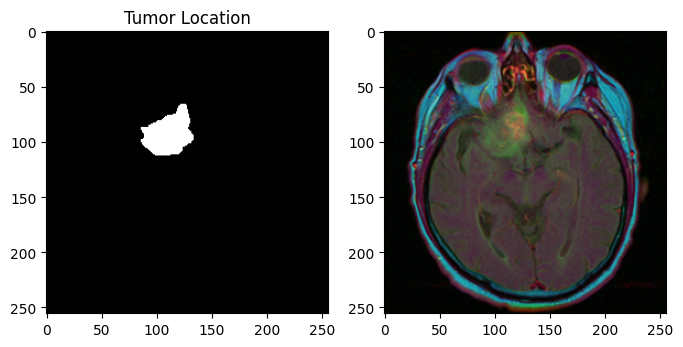

In [15]:
for i in range(len(brain_df)):
    if cv2.imread(brain_df.mask_path[i]).max() > 0:
        break

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(cv2.imread(brain_df.mask_path[i]));
plt.title('Tumor Location')

plt.subplot(1,2,2)
plt.imshow(cv2.imread(brain_df.image_path[i]));

In [16]:
cv2.imread(brain_df.mask_path[i]).max(), cv2.imread(brain_df.mask_path[i]).min()

(255, 0)

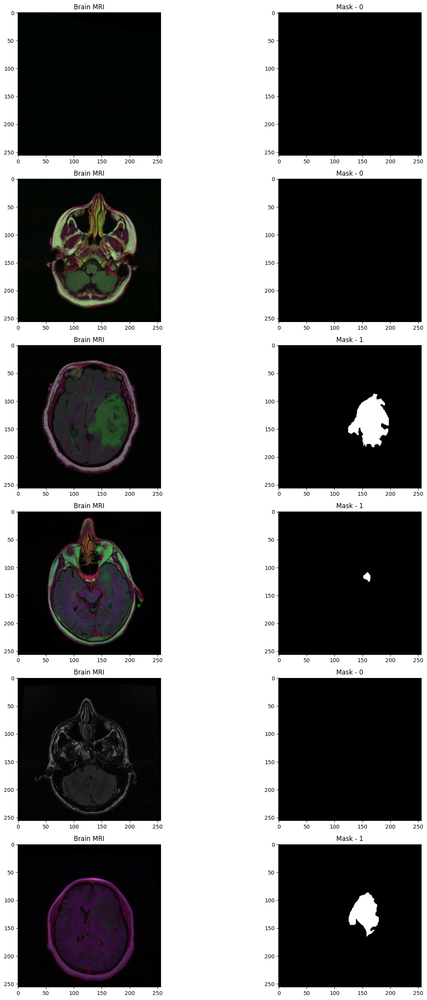

In [17]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately 

fig, axs = plt.subplots(6,2, figsize=(16,26))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI 
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

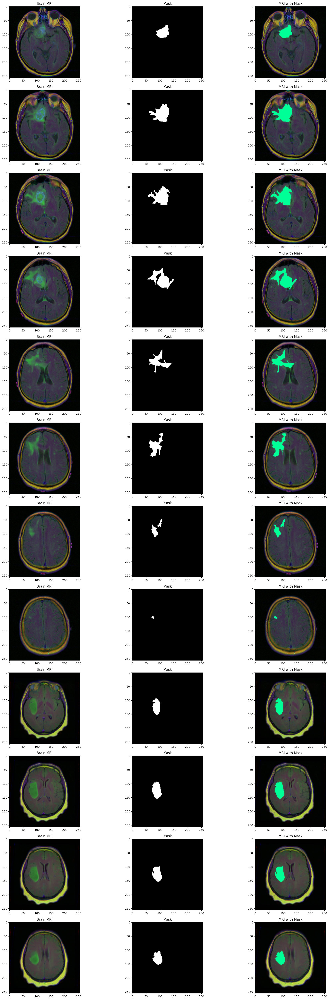

In [18]:
count = 0
i = 0
fig,axs = plt.subplots(12,3, figsize=(20,50))
for mask in brain_df['mask']:
    if (mask==1):
        img = io.imread(brain_df.image_path[i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)
        
        mask = io.imread(brain_df.mask_path[i])
        axs[count][1].title.set_text("Mask")
        axs[count][1].imshow(mask, cmap='gray')
        
        img[mask==255] = (0,255,150)  # change pixel color at the position of mask
        axs[count][2].title.set_text("MRI with Mask")
        axs[count][2].imshow(img)
        count +=1
    i += 1
    if (count==12):
        break
        
fig.tight_layout()

In [19]:
brain_df_train = brain_df.drop(columns=['patient_id'])
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [20]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size=0.15)

In [21]:
from keras_preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255., validation_split=0.1)

train_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='mask',
                                              subset='training',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
valid_generator = datagen.flow_from_dataframe(train,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='mask',
                                              subset='validation',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(test,
                                                  directory='./',
                                                  x_col='image_path',
                                                  y_col='mask',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  shuffle=False,
                                                  target_size=(256,256)
                                                 )

Found 3006 validated image filenames belonging to 2 classes.
Found 333 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [22]:
from tensorflow.keras.applications.resnet50 import ResNet50
clf_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256,256,3)))
clf_model.summary()

2023-04-22 16:57:07.351767: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /mnt/ufs18/home-230/mylakuma/anaconda3/envs/tensor/lib/python3.9/site-packages/cv2/../../lib64:/opt/software/CUDA/12.0.0/nvvm/lib64:/opt/software/CUDA/12.0.0/extras/CUPTI/lib64:/opt/software/CUDA/12.0.0/lib
2023-04-22 16:57:07.352079: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /mnt/ufs18/home-230/mylakuma/anaconda3/envs/tensor/lib/python3.9/site-packages/cv2/../../lib64:/opt/software/CUDA/12.0.0/nvvm/lib64:/opt/software/CUDA/12.0.0/extras/CUPTI/lib64:/opt/software/CUDA/12.0.0/lib
2023-04-22 16:57:07.352208: W tensorflow/compiler/xla/stream_executo

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [23]:
# before this i tried with trainable layer but the accuracy was less as compared
for layer in clf_model.layers:
    layers.trainable = False

In [24]:
head = clf_model.output
head = AveragePooling2D(pool_size=(4,4))(head)
head = Flatten(name='Flatten')(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(256, activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(2, activation='softmax')(head)

model = Model(clf_model.input, head)
model.compile(loss = 'categorical_crossentropy', 
              optimizer='adam', 
              metrics= ["accuracy"]
             )
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 64, 64, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 64, 64, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 64, 64, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_2_conv (Conv2D)   (None, 32, 32, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 32, 32, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization) 

 conv4_block5_1_conv (Conv2D)   (None, 16, 16, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 16, 16, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 16, 16, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 16, 16, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_blo

                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_block1_out (Activation)  (None, 8, 8, 2048)   0           ['conv5_block1_add[0][0]']       
                                                                                                  
 conv5_block2_1_conv (Conv2D)   (None, 8, 8, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 8, 8, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 8, 8, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)       

In [25]:
earlystopping = EarlyStopping(monitor='val_loss', 
                              mode='min', 
                              verbose=1, 
                              patience=15
                             )
checkpointer = ModelCheckpoint(filepath="clf-resnet-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

In [26]:
h = model.fit(train_generator, 
              steps_per_epoch= train_generator.n // train_generator.batch_size, 
              epochs = 20, 
              validation_data= valid_generator, 
              validation_steps= valid_generator.n // valid_generator.batch_size, 
              callbacks=[checkpointer, earlystopping])

Epoch 1/20
187/187 [==============================] - ETA: 0s - loss: 0.8742 - accuracy: 0.7311
Epoch 1: val_loss improved from inf to 1.01541, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 259s 1s/step - loss: 0.8742 - accuracy: 0.7311 - val_loss: 1.0154 - val_accuracy: 0.6594
Epoch 2/20
187/187 [==============================] - ETA: 0s - loss: 0.4006 - accuracy: 0.8281
Epoch 2: val_loss improved from 1.01541 to 0.75804, saving model to clf-resnet-weights.hdf5
187/187 [==============================] - 242s 1s/step - loss: 0.4006 - accuracy: 0.8281 - val_loss: 0.7580 - val_accuracy: 0.3406
Epoch 3/20
187/187 [==============================] - ETA: 0s - loss: 0.3764 - accuracy: 0.8425
Epoch 3: val_loss did not improve from 0.75804
187/187 [==============================] - 242s 1s/step - loss: 0.3764 - accuracy: 0.8425 - val_loss: 1.0267 - val_accuracy: 0.6625
Epoch 4/20
187/187 [==============================] - ETA: 0s - loss: 0.3154 - accuracy: 

In [27]:
#saving model achitecture in json file
model_json = model.to_json()
with open("clf-resnet-model.json", "w") as json_file:
    json_file.write(model_json)

In [28]:
h.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

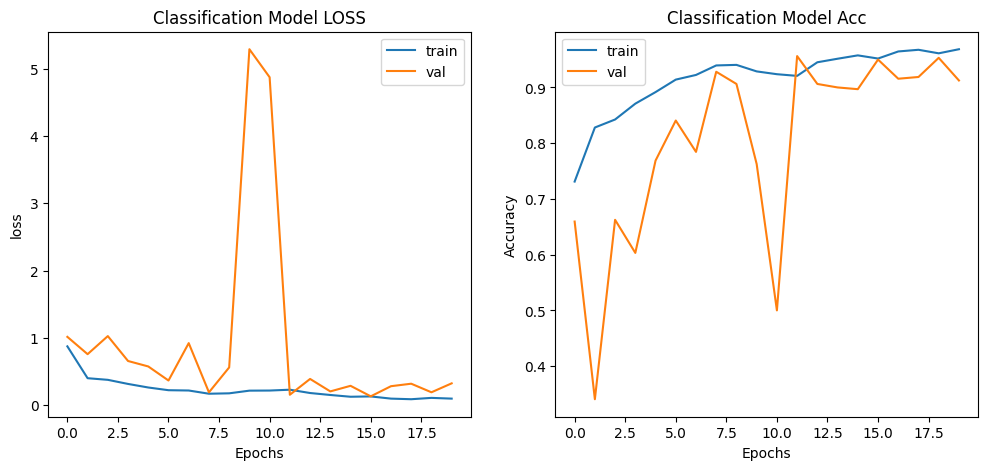

In [29]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("Classification Model LOSS");
plt.ylabel("loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['accuracy']);
plt.plot(h.history['val_accuracy']);
plt.title("Classification Model Acc");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [30]:
_, acc = model.evaluate(test_generator)
print("Test accuracy : {} %".format(acc*100))

37/37 [==============================] - 15s 396ms/step - loss: 0.2388 - accuracy: 0.9186
Test accuracy : 91.86440706253052 %


37/37 [==============================] - 15s 374ms/step
0.9186440677966101
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       382
           1       0.97      0.80      0.87       208

    accuracy                           0.92       590
   macro avg       0.93      0.89      0.91       590
weighted avg       0.92      0.92      0.92       590



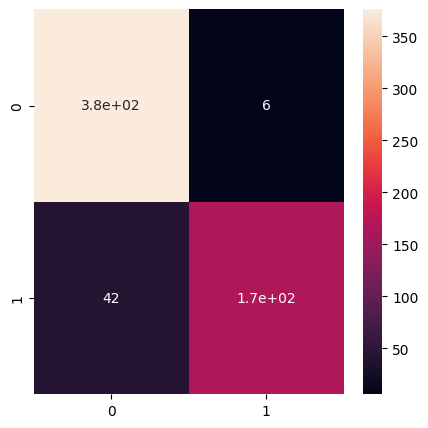

In [31]:
prediction = model.predict(test_generator)

pred = np.argmax(prediction, axis=1)
#pred = np.asarray(pred).astype('str')
original = np.asarray(test['mask']).astype('int')

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
accuracy = accuracy_score(original, pred)
print(accuracy)

cm = confusion_matrix(original, pred)

report = classification_report(original, pred, labels = [0,1])
print(report)
plt.figure(figsize = (5,5))
sns.heatmap(cm, annot=True);

In [32]:
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [33]:
# creating test, train and val sets
X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)
print("Train size is {}, valid size is {} & test size is {}".format(len(X_train), len(X_val), len(X_test)))

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

Train size is 1167, valid size is 103 & test size is 103


In [34]:
class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, ids , mask, image_dir = './', batch_size = 16, img_h = 256, img_w = 256, shuffle = True):

    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    'Get the number of batches per epoch'

    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    'Generate a batch of data'

    #generate index of batch_size length
    indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

    #get the ImageId corresponding to the indexes created above based on batch size
    list_ids = [self.ids[i] for i in indexes]

    #get the MaskId corresponding to the indexes created above based on batch size
    list_mask = [self.mask[i] for i in indexes]


    #generate data for the X(features) and y(label)
    X, y = self.__data_generation(list_ids, list_mask)

    #returning the data
    return X, y

  def on_epoch_end(self):
    'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'
    
    #getting the array of indices based on the input dataframe
    self.indexes = np.arange(len(self.ids))

    #if shuffle is true, shuffle the indices
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):
    'generate the data corresponding the indexes in a given batch of images'

    # create empty arrays of shape (batch_size,height,width,depth) 
    #Depth is 3 for input and depth is taken as 1 for output becasue mask consist only of 1 channel.
    X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
    y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

    #iterate through the dataframe rows, whose size is equal to the batch_size
    for i in range(len(list_ids)):
      #path of the image
      img_path = str(list_ids[i])
      
      #mask path
      mask_path = str(list_mask[i])
      
      #reading the original image and the corresponding mask image
      img = io.imread(img_path)
      mask = io.imread(mask_path)

      #resizing and coverting them to array of type float64
      img = cv2.resize(img,(self.img_h,self.img_w))
      img = np.array(img, dtype = np.float64)
      
      mask = cv2.resize(mask,(self.img_h,self.img_w))
      mask = np.array(mask, dtype = np.float64)

      #standardising 
      img -= img.mean()
      img /= img.std()
      
      mask -= mask.mean()
      mask /= mask.std()
      
      #Adding image to the empty array
      X[i,] = img
      
      #expanding the dimnesion of the image from (256,256) to (256,256,1)
      y[i,] = np.expand_dims(mask, axis = 2)
    
    #normalizing y
    y = (y > 0).astype(int)

    return X, y

train_data = DataGenerator(train_ids, train_mask)
val_data = DataGenerator(val_ids, val_mask)

In [35]:
# lets create model now
def resblock(X, f):
    '''
    function for creating res block
    '''
    X_copy = X  #copy of input
    
    # main path
    X = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    
    X = Conv2D(f, kernel_size=(3,3), padding='same', kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)
    
    # shortcut path
    X_copy = Conv2D(f, kernel_size=(1,1), kernel_initializer='he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)
    
    # Adding the output from main path and short path together
    X = Add()([X, X_copy])
    X = Activation('relu')(X)
    
    return X

def upsample_concat(x, skip):
    '''
    funtion for upsampling image
    '''
    X = UpSampling2D((2,2))(x)
    merge = Concatenate()([X, skip])
    
    return merge

In [36]:
input_shape = (256,256,3)
X_input = Input(input_shape) #iniating tensor of input shape

# Stage 1
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(X_input)
conv_1 = BatchNormalization()(conv_1)
conv_1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv_1)
conv_1 = BatchNormalization()(conv_1)
pool_1 = MaxPool2D((2,2))(conv_1)

# stage 2
conv_2 = resblock(pool_1, 32)
pool_2 = MaxPool2D((2,2))(conv_2)

# Stage 3
conv_3 = resblock(pool_2, 64)
pool_3 = MaxPool2D((2,2))(conv_3)

# Stage 4
conv_4 = resblock(pool_3, 128)
pool_4 = MaxPool2D((2,2))(conv_4)

# Stage 5 (bottle neck)
conv_5 = resblock(pool_4, 256)

# Upsample Stage 1
up_1 = upsample_concat(conv_5, conv_4)
up_1 = resblock(up_1, 128)

# Upsample Stage 2
up_2 = upsample_concat(up_1, conv_3)
up_2 = resblock(up_2, 64)

# Upsample Stage 3
up_3 = upsample_concat(up_2, conv_2)
up_3 = resblock(up_3, 32)

# Upsample Stage 4
up_4 = upsample_concat(up_3, conv_1)
up_4 = resblock(up_4, 16)

# final output
out = Conv2D(1, (1,1), kernel_initializer='he_normal', padding='same', activation='sigmoid')(up_4)

seg_model = Model(X_input, out)
seg_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                           

 conv2d_10 (Conv2D)             (None, 32, 32, 128)  8320        ['max_pooling2d_2[0][0]']        
                                                                                                  
 batch_normalization_9 (BatchNo  (None, 32, 32, 128)  512        ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 32, 32, 128)  512        ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_2 (Add)                    (None, 32, 32, 128)  0           ['batch_normalization_9[0][0]',  
                                                                  'batch_normalization_10[0][0]'] 
          

 batch_normalization_19 (BatchN  (None, 64, 64, 64)  256         ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_5 (Add)                    (None, 64, 64, 64)   0           ['batch_normalization_18[0][0]', 
                                                                  'batch_normalization_19[0][0]'] 
                                                                                                  
 activation_11 (Activation)     (None, 64, 64, 64)   0           ['add_5[0][0]']                  
                                                                                                  
 up_sampling2d_2 (UpSampling2D)  (None, 128, 128, 64  0          ['activation_11[0][0]']          
                                )                                                                 
          

In [37]:
# Define a custom loss function for ResUNet model

from keras.losses import binary_crossentropy

epsilon = 1e-5
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

In [38]:
# compling model and callbacks functions
adam = tf.keras.optimizers.Adam(learning_rate = 0.04, epsilon = 0.1)
seg_model.compile(optimizer = adam, 
                  loss = focal_tversky, 
                  metrics = [tversky]
                 )
#callbacks
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min', 
                              verbose=1, 
                              patience=20
                             )
# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-segModel-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

In [39]:
h = seg_model.fit(train_data, 
                  epochs = 60, 
                  validation_data = val_data,
                  callbacks = [checkpointer, earlystopping, reduce_lr]
                 )

Epoch 1/60
72/72 [==============================] - ETA: 0s - loss: 0.8993 - tversky: 0.1319
Epoch 1: val_loss improved from inf to 0.88492, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 65s 816ms/step - loss: 0.8993 - tversky: 0.1319 - val_loss: 0.8849 - val_tversky: 0.1503 - lr: 0.0400
Epoch 2/60
72/72 [==============================] - ETA: 0s - loss: 0.8377 - tversky: 0.2098
Epoch 2: val_loss improved from 0.88492 to 0.76197, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 58s 801ms/step - loss: 0.8377 - tversky: 0.2098 - val_loss: 0.7620 - val_tversky: 0.3040 - lr: 0.0400
Epoch 3/60
72/72 [==============================] - ETA: 0s - loss: 0.5394 - tversky: 0.5571
Epoch 3: val_loss improved from 0.76197 to 0.66446, saving model to ResUNet-segModel-weights.hdf5
72/72 [==============================] - 58s 800ms/step - loss: 0.5394 - tversky: 0.5571 - val_loss: 0.6645 - val_tversky: 0.4196 - lr: 0.0400
Ep

Epoch 27/60
72/72 [==============================] - ETA: 0s - loss: 0.1271 - tversky: 0.9358
Epoch 27: val_loss did not improve from 0.16575
72/72 [==============================] - 60s 825ms/step - loss: 0.1271 - tversky: 0.9358 - val_loss: 0.1675 - val_tversky: 0.9072 - lr: 0.0400
Epoch 28/60
72/72 [==============================] - ETA: 0s - loss: 0.1243 - tversky: 0.9377
Epoch 28: val_loss did not improve from 0.16575
72/72 [==============================] - 60s 829ms/step - loss: 0.1243 - tversky: 0.9377 - val_loss: 0.1779 - val_tversky: 0.8987 - lr: 0.0400
Epoch 29/60
72/72 [==============================] - ETA: 0s - loss: 0.1257 - tversky: 0.9367
Epoch 29: val_loss did not improve from 0.16575
72/72 [==============================] - 65s 899ms/step - loss: 0.1257 - tversky: 0.9367 - val_loss: 0.2257 - val_tversky: 0.8615 - lr: 0.0400
Epoch 30/60
72/72 [==============================] - ETA: 0s - loss: 0.1256 - tversky: 0.9368
Epoch 30: val_loss improved from 0.16575 to 0.16115

Epoch 55/60
72/72 [==============================] - ETA: 0s - loss: 0.0827 - tversky: 0.9639
Epoch 55: val_loss did not improve from 0.15565
72/72 [==============================] - 57s 794ms/step - loss: 0.0827 - tversky: 0.9639 - val_loss: 0.1710 - val_tversky: 0.9045 - lr: 0.0080
Epoch 56/60
72/72 [==============================] - ETA: 0s - loss: 0.0836 - tversky: 0.9633
Epoch 56: val_loss did not improve from 0.15565
72/72 [==============================] - 57s 794ms/step - loss: 0.0836 - tversky: 0.9633 - val_loss: 0.1734 - val_tversky: 0.9027 - lr: 0.0080
Epoch 57/60
72/72 [==============================] - ETA: 0s - loss: 0.0832 - tversky: 0.9636
Epoch 57: val_loss did not improve from 0.15565

Epoch 57: ReduceLROnPlateau reducing learning rate to 0.0015999998897314072.
72/72 [==============================] - 57s 793ms/step - loss: 0.0832 - tversky: 0.9636 - val_loss: 0.1633 - val_tversky: 0.9097 - lr: 0.0080
Epoch 58/60
72/72 [==============================] - ETA: 0s - loss

In [40]:
h.history.keys()

dict_keys(['loss', 'tversky', 'val_loss', 'val_tversky', 'lr'])

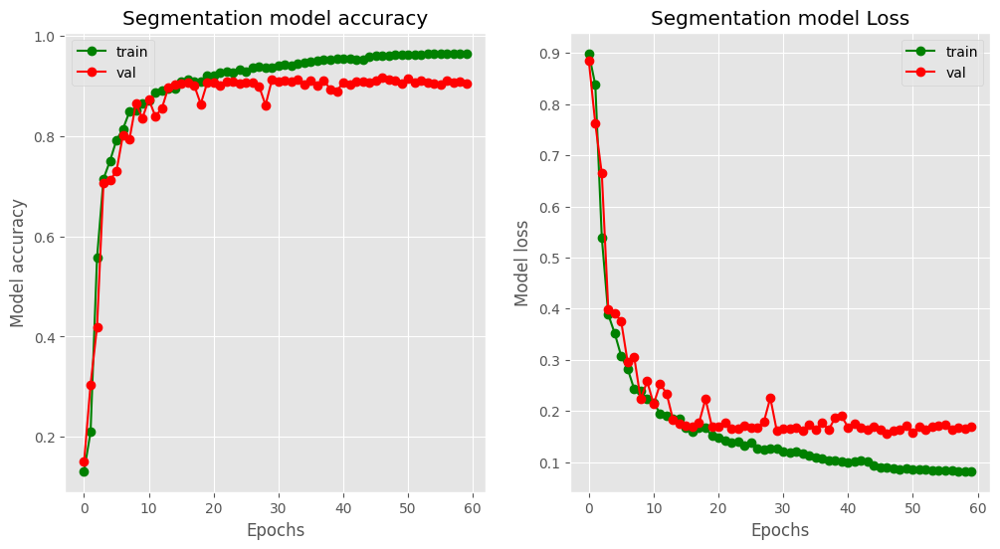

In [41]:
plt.style.use("ggplot")
plt.figure(figsize=(12, 6))
plt.subplot(1,2,2)
plt.plot(h.history['loss'], "go-");
plt.plot(h.history['val_loss'],  "ro-");
plt.title("Segmentation model Loss");
plt.ylabel("Model loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,1)
plt.plot(h.history['tversky'], "go-");
plt.plot(h.history['val_tversky'],  "ro-");
plt.title("Segmentation model accuracy");
plt.ylabel("Model accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [42]:
test_ids = list(X_test.image_path)
test_mask = list(X_test.mask_path)
test_data = DataGenerator(test_ids, test_mask)
_, tv = seg_model.evaluate(test_data)
print("Segmentation accuracy is {:.2f}%".format(tv*100))

6/6 [==============================] - 3s 559ms/step - loss: 0.1751 - tversky: 0.9016
Segmentation accuracy is 90.16%


In [43]:
def prediction(test, model, model_seg):
    '''
    Predcition function which takes dataframe containing ImageID as Input and perform 2 type of prediction on the image
    Initially, image is passed through the classification network which predicts whether the image has defect or not, if the model
    is 99% sure that the image has no defect, then the image is labeled as no-defect, if the model is not sure, it passes the image to the
    segmentation network, it again checks if the image has defect or not, if it has defect, then the type and location of defect is found
    '''
    # empty list to store results
    mask, image_id, has_mask = [], [], []
    
    #itetrating through each image in test data
    for i in test.image_path:
        
        img = io.imread(i)
        #normalizing
        img = img *1./255.
        #reshaping
        img = cv2.resize(img, (256,256))
        # converting img into array
        img = np.array(img, dtype=np.float64)
        #reshaping the image from 256,256,3 to 1,256,256,3
        img = np.reshape(img, (1,256,256,3))
        
        #making prediction for tumor in image
        is_defect = model.predict(img)
        
        #if tumour is not present we append the details of the image to the list
        if np.argmax(is_defect)==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask :)')
            continue
        
        #Creating a empty array of shape 1,256,256,1
        X = np.empty((1,256,256,3))
        # read the image
        img = io.imread(i)
        #resizing the image and coverting them to array of type float64
        img = cv2.resize(img, (256,256))
        img = np.array(img, dtype=np.float64)
        
        # standardising the image
        img -= img.mean()
        img /= img.std()
        #converting the shape of image from 256,256,3 to 1,256,256,3
        X[0,] = img
        
        #make prediction of mask
        predict = model_seg.predict(X)
        
        # if sum of predicted mask is 0 then there is not tumour
        if predict.round().astype(int).sum()==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask :)')
        else:
        #if the sum of pixel values are more than 0, then there is tumour
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)
            
    return pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})

In [44]:
# making prediction
df_pred = prediction(test, model, seg_model)
df_pred

1/1 [==============================] - 0s 96ms/step


1/1 [==============================] - 0s 89ms/step


1/1 [==============================] - 0s 44ms/step


,image_path,predicted_mask,has_mask
0,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
1,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
2,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,"[[[[2.5703855e-05], [9.380626e-06], [1.886223e...",1
3,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
4,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,"[[[[3.4331293e-05], [2.252533e-05], [2.536514e...",1
...,...,...,...
585,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
586,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
587,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0
588,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,No mask :),0


In [45]:
# merging original and prediction df
df_pred = test.merge(df_pred, on='image_path')
df_pred.head(10)

,image_path,mask_path,mask,predicted_mask,has_mask
0,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0
1,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0
2,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,"[[[[2.5703855e-05], [9.380626e-06], [1.886223e...",1
3,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0
4,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1,"[[[[3.4331293e-05], [2.252533e-05], [2.536514e...",1
5,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1,No mask :),0
6,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0
7,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,1,"[[[[2.2246692e-05], [9.726807e-06], [1.781851e...",1
8,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0
9,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,/mnt/home/mylakuma/Brain-Tumor-Multiclass-Clas...,0,No mask :),0


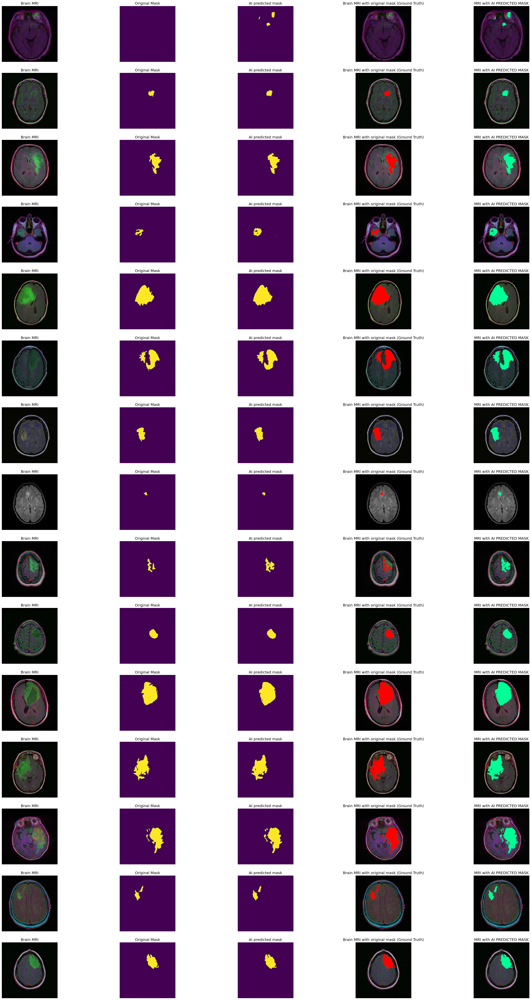

In [49]:
#visualizing prediction
count = 0
fig, axs = plt.subplots(15,5, figsize=(40,70))

for i in range(len(df_pred)):
    if df_pred.has_mask[i]==1 and count<15:
        #read mri images
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[count][0].imshow(img)
        axs[count][0].title.set_text('Brain MRI')
        axs[count][0].axis('off')
        
        #read original mask
        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].imshow(mask)
        axs[count][1].title.set_text('Original Mask')
        axs[count][1].axis('off')
        
        #read predicted mask
        pred = np.array(df_pred.predicted_mask[i]).squeeze().round()
        axs[count][2].imshow(pred)
        axs[count][2].title.set_text('AI predicted mask')
        axs[count][2].axis('off')
        
        #overlay original mask with MRI
        img[mask==255] = (255,0,0)
        axs[count][3].imshow(img)
        axs[count][3].title.set_text('Brain MRI with original mask (Ground Truth)')
        axs[count][3].axis('off')
        
        #overlay predicted mask and MRI
        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
        img_[pred==1] = (0,255,150)
        axs[count][4].imshow(img_)
        axs[count][4].title.set_text('MRI with AI PREDICTED MASK')
        axs[count][4].axis('off')
        count +=1
    if (count==15):
        break